In [19]:
#Importing Libraries
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [20]:
#Importing data
data=pd.read_csv("C:/Users/DC/Downloads/bias_correction_ucl.csv",parse_dates=['Date'])
df=pd.DataFrame(data)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [21]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

In [22]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [23]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


It can be seen that outliers and very little skewness is preent is some of the columns

In [24]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [25]:
df.dropna(inplace=True)

In [26]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,2017-08-30,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,2017-08-30,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [28]:
#Date modification

df_date=pd.DataFrame()
df_date['month']=df['Date'].dt.month_name()
df_date['year']=df['Date'].dt.year
df_date['day']=df['Date'].dt.day_name()

In [29]:
df_date['pTmax']=df['Present_Tmax']
df_date['pTmin']=df['Present_Tmin']
df_date['fTmax']=df['Next_Tmax']
df_date['fTmin']=df['Next_Tmin']
df_date

,month,year,day,pTmax,pTmin,fTmax,fTmin
0,June,2013,Sunday,28.7,21.4,29.1,21.2
1,June,2013,Sunday,31.9,21.6,30.5,22.5
2,June,2013,Sunday,31.6,23.3,31.1,23.9
3,June,2013,Sunday,32.0,23.4,31.7,24.3
4,June,2013,Sunday,31.4,21.9,31.2,22.5
...,...,...,...,...,...,...,...
7745,August,2017,Wednesday,23.1,17.8,27.6,17.7
7746,August,2017,Wednesday,22.5,17.4,28.0,17.1
7747,August,2017,Wednesday,23.3,17.1,28.3,18.1
7748,August,2017,Wednesday,23.3,17.7,28.6,18.8


In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

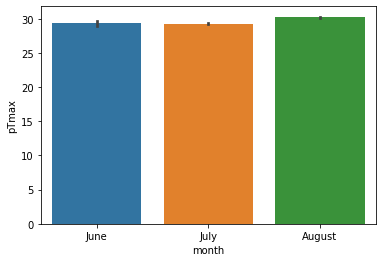

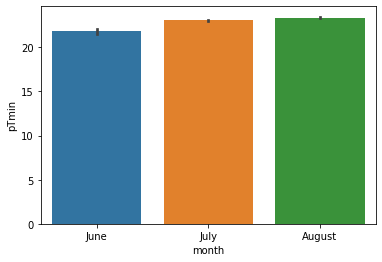

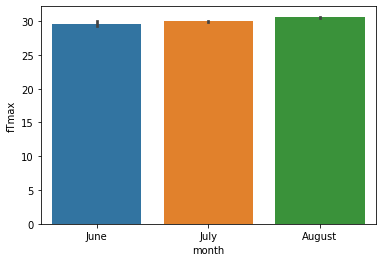

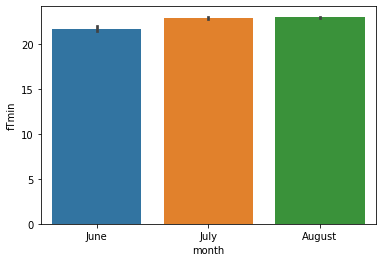

In [33]:
a=['pTmax','pTmin','fTmax','fTmin']
for i in a:
    plt.figure()
    sns.barplot('month',i,data=df_date)

ptmax,ptmin,ftmax and ft min are highest in august and lowest in june except ptmax is lowest in july.

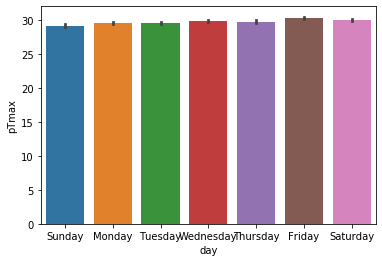

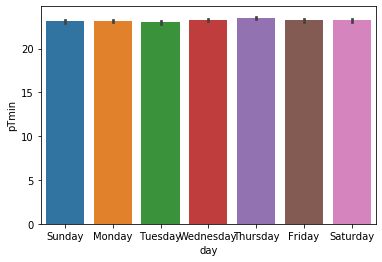

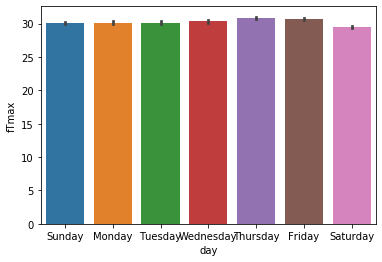

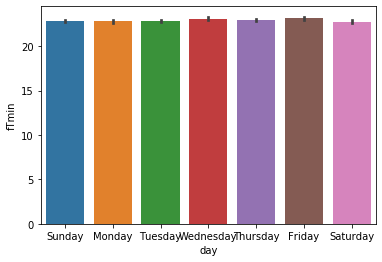

In [34]:
for i in a:
    plt.figure()
    sns.barplot('day',i,data=df_date)

ptmax is highest on friday and lowest on sunday.ptmin is highest on thrusday and lowest on tuesday.ftmax is highest on thursday and lowest on saturday.ftmin is highest on friday and lowest on saturday.

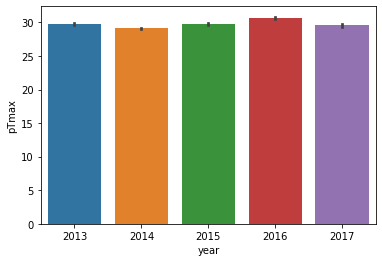

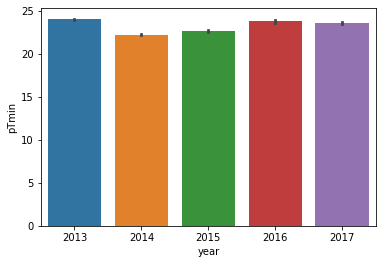

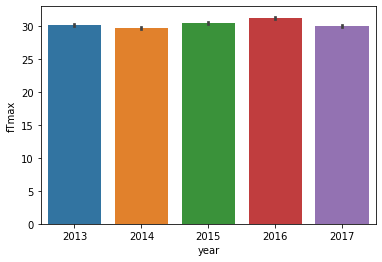

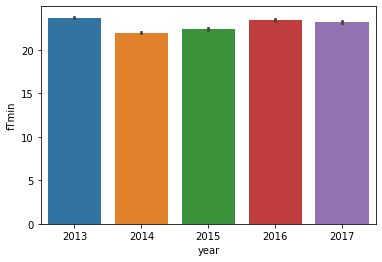

In [35]:
for i in a:
    plt.figure()
    sns.barplot('year',i,data=df_date)

ptmax is highest on 2016 and lowest on 2014.ptmin is highest on 2013 and lowest on 2014.ftmax is highest on 2016 and lowest on 2014.ftmin is highest on 2013 and lowest on 2014.

In [36]:
df.drop(['Date'],axis=1,inplace=True)

In [37]:
#Outliers check and treatment 
from scipy.stats import zscore 
threhold=3 
z=np.abs(zscore(df)) 
print(np.where(z>3))

(array([  25,   25,   26, ..., 7581, 7582, 7582], dtype=int64), array([ 7, 14, 14, ...,  2,  2,  6], dtype=int64))


In [38]:
df=df[(z<3).all(axis=1)]
df

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,...,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,...,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [39]:
#Correlation
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.110291,0.133638,-0.069582,-0.176388,0.066863,0.104401,0.023075,-0.135023,0.008671,...,-0.021036,0.002851,0.015223,-0.241811,-0.122829,-0.257894,-0.096863,-0.032810,0.106378,0.129110
Present_Tmax,0.110291,1.000000,0.610428,-0.154266,-0.297804,0.540680,0.616886,-0.105162,0.130771,-0.290078,...,-0.040151,-0.015137,-0.042837,-0.052041,0.011132,-0.168792,-0.091336,-0.059891,0.586943,0.615950
Present_Tmin,0.133638,0.610428,1.000000,0.151385,-0.039688,0.441577,0.764258,0.018711,-0.004055,0.090828,...,0.084705,0.036206,-0.055364,-0.072707,-0.043201,-0.241396,-0.138107,0.020030,0.438813,0.785946
LDAPS_RHmin,-0.069582,-0.154266,0.151385,1.000000,0.552581,-0.555583,0.129481,0.236324,-0.035217,0.574389,...,0.376428,0.257765,0.185176,0.090054,-0.093969,0.094391,0.119216,0.251733,-0.433872,0.134518
LDAPS_RHmax,-0.176388,-0.297804,-0.039688,0.552581,1.000000,-0.385695,-0.142575,0.094523,0.274590,0.409436,...,0.225832,0.120010,0.106028,0.200216,0.018945,0.172348,0.218465,0.153673,-0.301797,-0.097490
LDAPS_Tmax_lapse,0.066863,0.540680,0.441577,-0.555583,-0.385695,1.000000,0.621299,-0.229614,0.036340,-0.416255,...,-0.237892,-0.141172,-0.160177,-0.038285,0.106354,-0.162061,-0.148246,0.012974,0.816861,0.553227
LDAPS_Tmin_lapse,0.104401,0.616886,0.764258,0.129481,-0.142575,0.621299,1.000000,-0.052648,-0.135842,0.037375,...,0.012282,0.012854,-0.081221,-0.090587,-0.024177,-0.177845,-0.172382,0.106033,0.546479,0.875382
LDAPS_WS,0.023075,-0.105162,0.018711,0.236324,0.094523,-0.229614,-0.052648,1.000000,-0.045067,0.257654,...,0.115051,0.121172,0.196309,-0.014440,-0.077116,0.150448,0.118546,0.136180,-0.277823,-0.013668
LDAPS_LH,-0.135023,0.130771,-0.004055,-0.035217,0.274590,0.036340,-0.135842,-0.045067,1.000000,-0.144578,...,-0.066290,0.010732,0.038641,0.124764,0.021578,0.068085,0.100776,-0.031060,0.176077,-0.046540
LDAPS_CC1,0.008671,-0.290078,0.090828,0.574389,0.409436,-0.416255,0.037375,0.257654,-0.144578,1.000000,...,0.394805,0.191398,0.196073,-0.006352,-0.013794,-0.030685,-0.036418,0.244497,-0.453763,0.008400


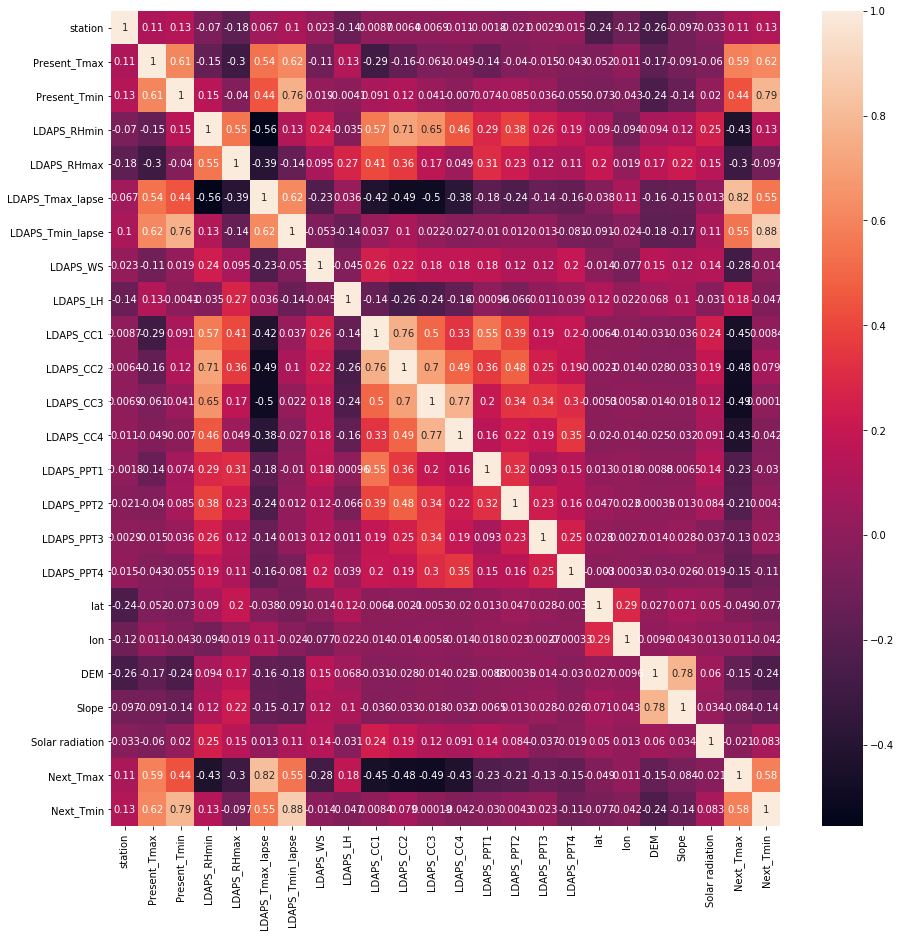

In [41]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True)

next_tmax has significant positive correlation with presnt tmax,present tmin,ldaps tmax lapse,ldaps tmin lapse and next tmin. next_tmin has significant positive correlation with presnt tmax,present tmin,ldaps tmax lapse,ldaps tmin lapse and next tmax.
slope and dem has postive correlation.ldaps cc1,cc2,cc3,cc4 and rhmin have positive correlation.

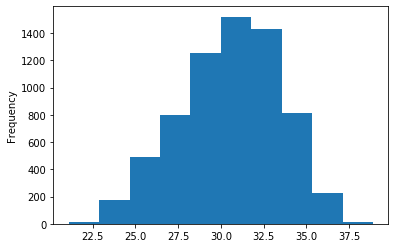

In [100]:
plt.figure()
df['Next_Tmax'].plot(kind='hist')

Next_Tmax=31(approx) has the highest frequency

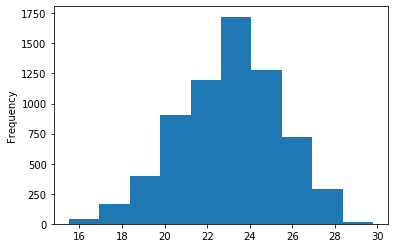

In [101]:
plt.figure()
df['Next_Tmin'].plot(kind='hist')

Next tmin=23(approx) has the highest frequency.

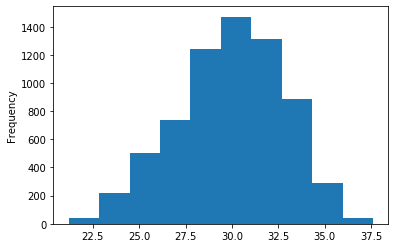

In [102]:
plt.figure()
df['Present_Tmax'].plot(kind='hist')

Present tmax=30(approx) has the highest frequency

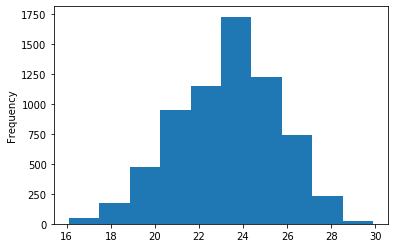

In [103]:
plt.figure()
df['Present_Tmin'].plot(kind='hist')

Present tmin=23.5 (approx) has the highest frequency.

<Figure size 432x288 with 0 Axes>

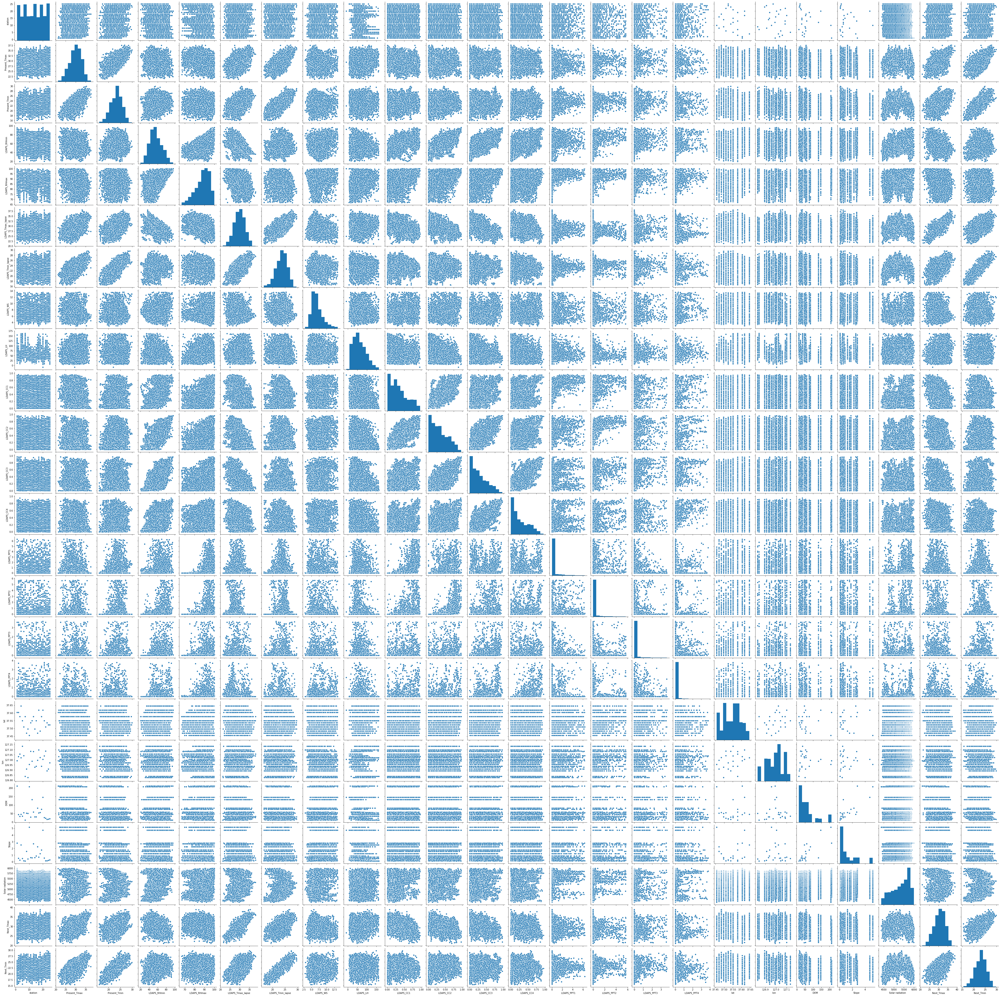

In [42]:
plt.figure()
sns.pairplot(df)

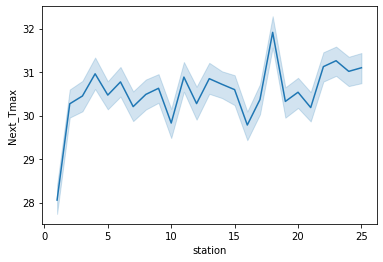

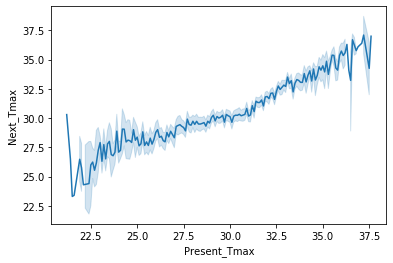

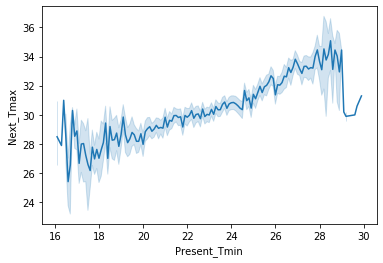

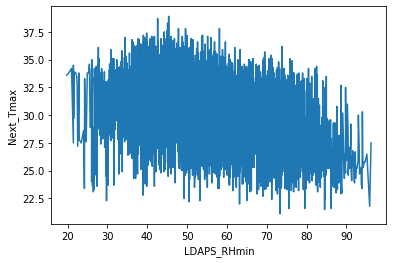

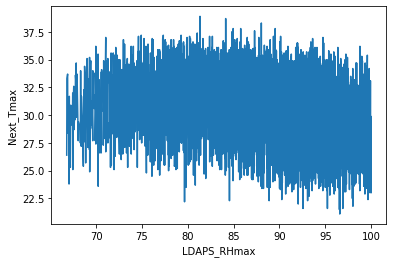

...

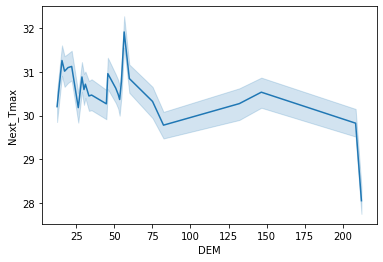

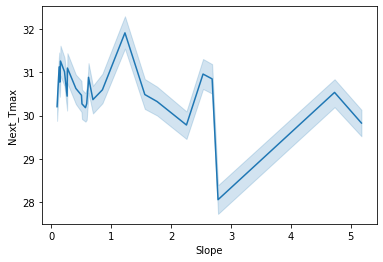

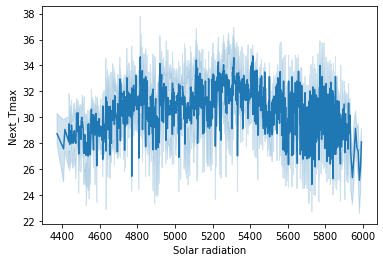

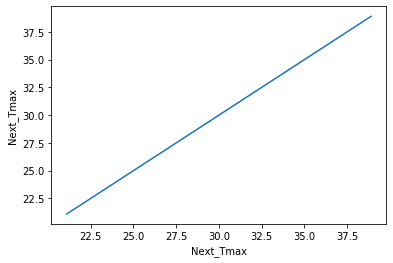

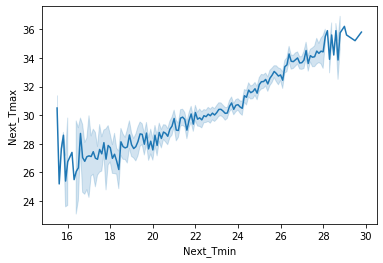

In [43]:
for i in df.columns:
    plt.figure()
    sns.lineplot(i,'Next_Tmax',data=df)

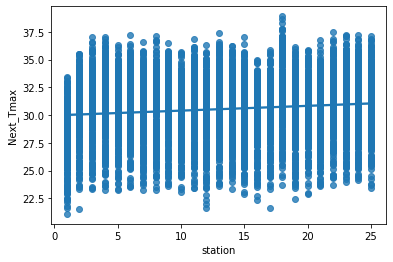

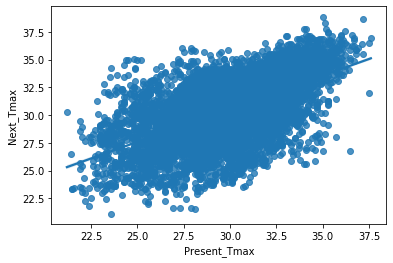

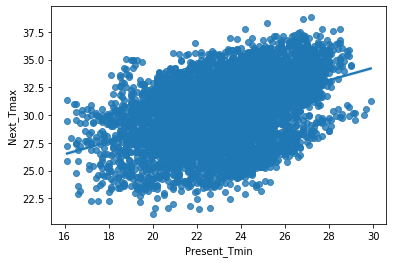

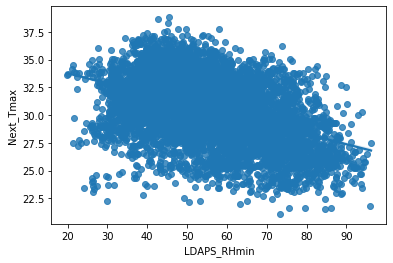

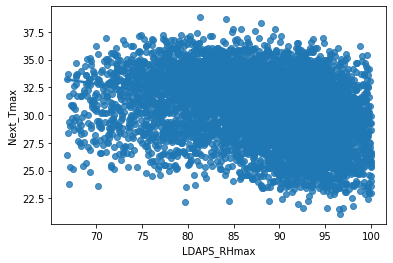

...

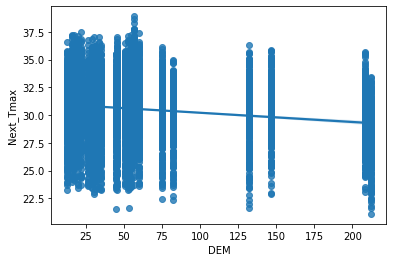

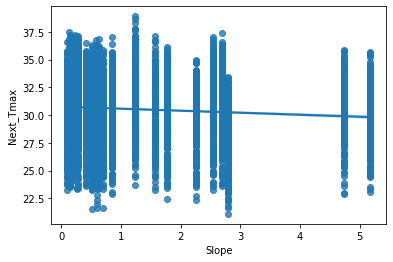

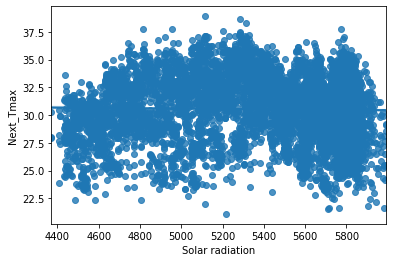

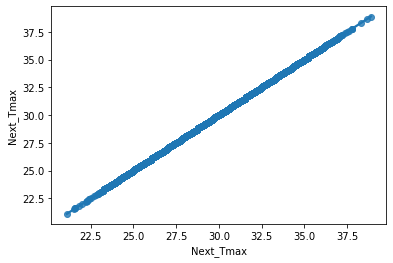

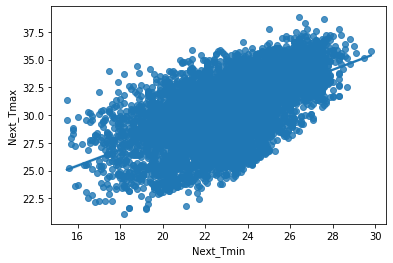

In [45]:
for i in df.columns:
    plt.figure()
    sns.regplot(i,'Next_Tmax',data=df)

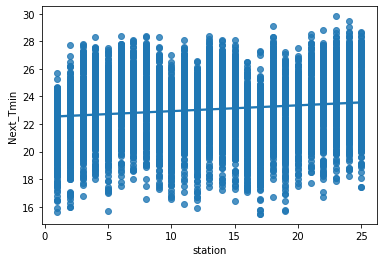

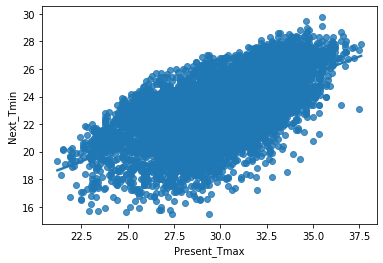

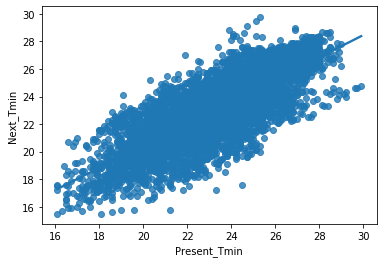

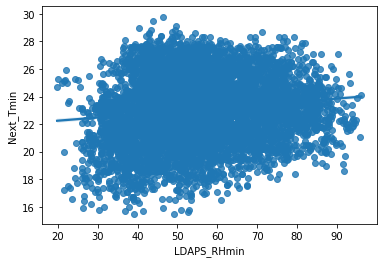

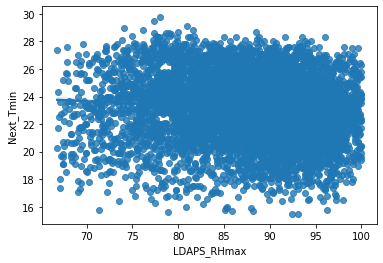

...

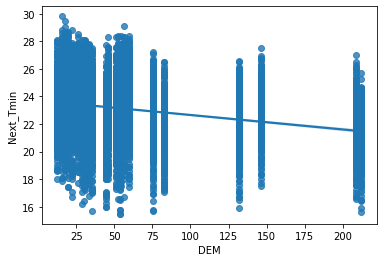

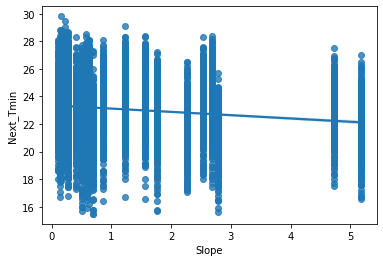

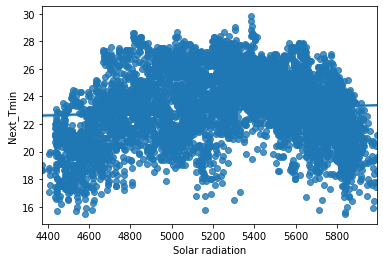

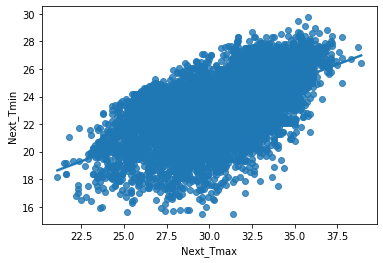

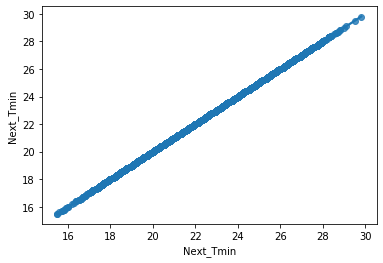

In [46]:
for i in df.columns:
    plt.figure()
    sns.regplot(i,'Next_Tmin',data=df)

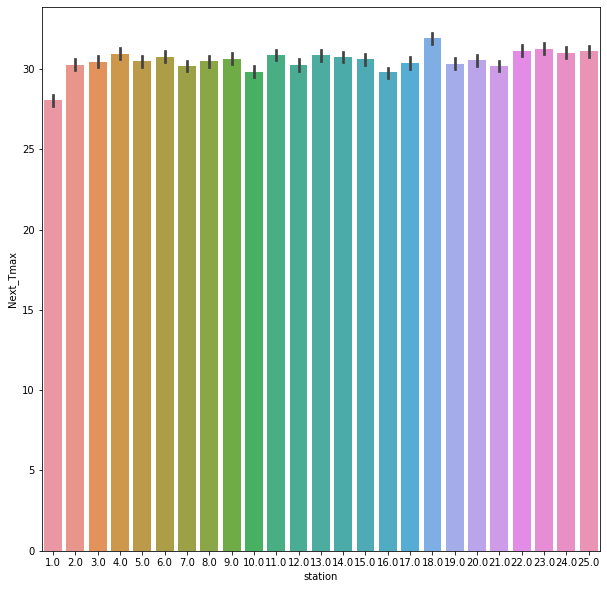

In [98]:
plt.figure(figsize=(10,10))
sns.barplot('station','Next_Tmax',data=df)

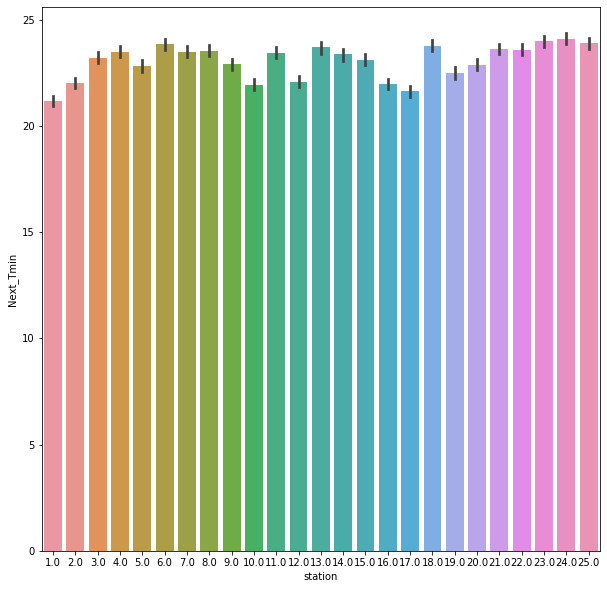

In [99]:
plt.figure(figsize=(10,10))
sns.barplot('station','Next_Tmin',data=df)

Tmax is highest at station 18 and lowest at 1.Tmin is highest at station 24 and lowest at 1. Next tmax increases with increase in solar radiation,present tmax,present tmin,ldaps tmax lapse, ladaps tmin lapse,ldaps rhmax,ldaps lh and next tmin. Next tmin increases with increase in present tmax,present tmin,ldaps rhmin,ldaps tmax lapse, ladaps tmin lapse,ldaps lh and next tmax.Next tmax decreases with increase in ldaps ws, ldaps rhmin, ldaps cc1 to cc4, ldaps ppt1 to ppt4, dem,slope..Next tmin decreases with increase in ldaps lh, ldaps rhmax, ldaps cc1 to cc4, ldaps ppt1 to ppt4, dem,slope.

In [47]:
df.skew()

station            -0.001594
Present_Tmax       -0.269936
Present_Tmin       -0.221250
LDAPS_RHmin         0.309567
LDAPS_RHmax        -0.686083
LDAPS_Tmax_lapse   -0.110563
LDAPS_Tmin_lapse   -0.379269
LDAPS_WS            1.085685
LDAPS_LH            0.567050
LDAPS_CC1           0.594835
LDAPS_CC2           0.505774
LDAPS_CC3           0.701288
LDAPS_CC4           0.708754
LDAPS_PPT1          3.724580
LDAPS_PPT2          4.854967
LDAPS_PPT3          5.516862
LDAPS_PPT4          5.924324
lat                 0.106983
lon                -0.277547
DEM                 1.764698
Slope               1.590130
Solar radiation    -0.520157
Next_Tmax          -0.267526
Next_Tmin          -0.234328
dtype: float64

In [49]:
#skewness treatment
for i in df.columns:
    if df.skew().loc[i]>0.55:
        df[i]=df[i].apply(lambda x:np.log(x+1))

In [55]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            1
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [56]:
df.dropna(inplace=True)

In [57]:
#X y division of data
x=df.drop(['Next_Tmax'],axis=1)
x=x.drop(['Next_Tmin'],axis=1)
y=df['Next_Tmax']
y=y.values.reshape(-1,1)
y.shape

(6738, 1)

In [58]:
#scaling the data
import sklearn
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
dx=scale.fit_transform(x)
x=pd.DataFrame(dx,columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.672567,-0.425700,-0.814500,0.196395,0.437853,-0.662880,-0.289974,0.092417,0.452470,-0.379706,...,-0.588310,-0.40175,-0.339228,-0.30398,-0.276791,1.211493,0.002950,2.091799,1.331482,1.543379
1,-1.533807,0.690139,-0.727830,-0.236316,0.364545,-0.016965,0.171305,-0.612724,-0.012952,-0.417455,...,-0.604343,-0.40175,-0.339228,-0.30398,-0.276791,1.211493,0.518720,-0.026183,-0.501985,1.249793
2,-1.395048,0.585529,0.008862,-0.494322,-0.585562,0.070512,0.409386,-0.320205,-1.474701,-0.490491,...,-0.532582,-0.40175,-0.339228,-0.30398,-0.276791,0.671747,0.845794,-0.422591,-0.859943,1.236117
3,-1.256289,0.725009,0.052197,0.195247,1.206882,-0.070068,-0.146736,-0.641138,0.364021,-0.458616,...,-0.571727,-0.40175,-0.339228,-0.30398,-0.276791,2.019113,0.392922,0.002192,1.194627,1.220460
4,-1.117529,0.515789,-0.597826,0.046081,0.300127,-0.284827,-0.074811,-0.583629,1.162615,-0.760531,...,-0.396085,-0.40175,-0.339228,-0.30398,-0.276791,0.134000,1.814435,-0.354858,-0.513383,1.226606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6733,1.102620,-2.378419,-2.374555,-2.227501,-1.404006,-0.757919,-2.400544,-0.034280,-2.629659,-1.252469,...,-1.259561,-0.40175,-0.339228,-0.30398,-0.276791,0.134000,0.619358,-0.737014,-0.426761,-2.107632
6734,1.241379,-2.587639,-2.547895,-1.837137,-0.626192,-1.160680,-2.619939,-0.561432,0.722258,-1.182087,...,-1.185161,-0.40175,-0.339228,-0.30398,-0.276791,-0.675620,1.198027,-0.974711,-1.081858,-2.141415
6735,1.380138,-2.308680,-2.677899,-2.079301,-1.316823,-1.288956,-2.188467,-0.313423,0.511627,-1.373252,...,-1.284283,-0.40175,-0.339228,-0.30398,-0.276791,-0.135873,-1.255026,-1.422404,-1.043034,-2.137827
6736,1.518898,-2.308680,-2.417890,-2.274320,-1.542472,-1.049685,-2.207383,-0.070434,-0.164217,-1.342155,...,-1.284283,-0.40175,-0.339228,-0.30398,-0.276791,-0.405746,-1.028591,-1.287564,-0.930396,-2.149563


In [59]:
from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.externals import joblib

In [60]:
#Calculating best r score
def max_score(model):
    max_score=0
    for r_state in range(42,100):
        xtrain,xtest,ytrain,ytest=train_test_split(x,y,random_state=r_state,test_size=0.20)
        model.fit(xtrain,ytrain)
        ypred=model.predict(xtest)
        r2=r2_score(ytest,ypred)
        if r2>max_score:
            max_score=r2
            final_r_state=r_state
    print(max_score,'is max accuracy against r_state',final_r_state)


In [61]:
lr=LinearRegression()
max_score(lr)

0.7790188345795876 is max accuracy against r_state 72


In [63]:
alpha={'alpha':[.0001,.001,.01,.1,1,10]}
grid=GridSearchCV(estimator=Ridge(),param_grid=alpha)
grid.fit(x,y)
print(grid.best_params_)

{'alpha': 10}


In [64]:
rd=Ridge(alpha=10)
max_score(rd)

0.7789988062148034 is max accuracy against r_state 72


In [65]:
alpha={'alpha':[.0001,.001,.01,.1,1,10]}
grid1=GridSearchCV(estimator=Lasso(),param_grid=alpha)
grid1.fit(x,y)
print(grid1.best_params_)

{'alpha': 0.01}


In [66]:
ls=Lasso(alpha=0.01)
max_score(ls)

0.7789155530523497 is max accuracy against r_state 72


In [67]:
alpha={'alpha':[.0001,.001,.01,.1,1,10]}
grid=GridSearchCV(estimator=ElasticNet(),param_grid=alpha)
grid.fit(x,y)
print(grid.best_params_)

{'alpha': 0.1}


In [68]:
en=ElasticNet(alpha=0.1)
max_score(en)

0.7746050233142427 is max accuracy against r_state 43


In [69]:
from sklearn.svm import SVR
para={'kernel':['rbf','linear','poly']}
grid=GridSearchCV(estimator=SVR(),param_grid=para)
grid.fit(x,y)
print(grid.best_params_)

{'kernel': 'linear'}


In [70]:
svr=SVR(kernel='linear')
max_score(svr)

0.7781634856517732 is max accuracy against r_state 72


In [71]:
from sklearn.neighbors import KNeighborsRegressor
#Knr
n_neighbors={'n_neighbors':[2,3,4,5,6,7,8,9]}
grid=GridSearchCV(estimator=KNeighborsRegressor(),param_grid=n_neighbors)
grid.fit(x,y)
print(grid.best_params_)

{'n_neighbors': 9}


In [72]:
knr=KNeighborsRegressor(n_neighbors=9)
max_score(knr)

0.8346735025148407 is max accuracy against r_state 66


In [73]:
from sklearn.tree import DecisionTreeRegressor
para={'criterion':['mse','mae','friedman_mse']}
grid=GridSearchCV(estimator=DecisionTreeRegressor(),param_grid=para)
grid.fit(x,y)
print(grid.best_params_)

{'criterion': 'mae'}


In [74]:
dtr=DecisionTreeRegressor(criterion='mae')
max_score(dtr)

0.7661535472638611 is max accuracy against r_state 49


In [75]:
import xgboost
from xgboost import XGBRegressor

In [76]:
xgbr=XGBRegressor()
max_score(xgbr)

0.9140974068917381 is max accuracy against r_state 72


In [77]:
from sklearn.ensemble import GradientBoostingRegressor
para={'n_estimators':[100,200,300,500],'learning_rate':[1,0.1,0.01,0.001]}
grid=GridSearchCV(estimator=GradientBoostingRegressor(),param_grid=para)
grid.fit(x,y)
print(grid.best_params_)

{'learning_rate': 0.01, 'n_estimators': 500}


In [78]:
gdr=GradientBoostingRegressor(learning_rate=0.01,n_estimators=500)
max_score(gdr)

0.8211687715005873 is max accuracy against r_state 43


In [81]:
models=[]
models.append(('Linear Regression',lr,72))
models.append(('Lasso Regression',ls,72))
models.append(('Ridge regression',rd,72))
models.append(('Elastic Net',en,43))
models.append(('Support Vector Regressor',svr,72))
models.append(('KNeighborsRegressor',knr,66))
models.append(('DecisionTreeRegressor',dtr,49))
models.append(('XGBoostRegressor',xgbr,72))
models.append(('GradientBoostingRegressor',gdr,43))

Model=[]
R2Score=[]
Cvs=[]
MAE=[]
MSE=[]
RMSE=[]

In [82]:
for name,model,randomstate in models:
    print('***********',name,'************')
    print('\n')
    Model.append(name)
    xtrain,xtest,ytrain,ytest=train_test_split(x,y,random_state=randomstate,test_size=0.20)
    model.fit(xtrain,ytrain)
    print(model)
    pred=model.predict(xtest)
    print('\n')
    R2=r2_score(ytest,pred)
    print('R2 score=',R2)
    R2Score.append(R2*100)
    print('\n')
    cvs=cross_val_score(model,x,y,cv=5,scoring='r2').mean()
    print('Cross Validation Score=',cvs)
    Cvs.append(cvs)
    print('\n')
    mae=mean_absolute_error(ytest,pred)
    print('Mean Absolute Error=',mae)
    MAE.append(mae)
    print('\n')
    mse=mean_squared_error(ytest,pred)
    print("Mean Squared Error=",mse)
    MSE.append(mse)
    print('\n')
    rmse=np.sqrt(mean_squared_error(ytest,pred))
    print('Root Mean Squared Error=',rmse)
    RMSE.append(rmse)

*********** Linear Regression ************


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


R2 score= 0.7790188345795876


Cross Validation Score= 0.6898256823106182


Mean Absolute Error= 1.0697744574923735


Mean Squared Error= 1.9214269854326722


Root Mean Squared Error= 1.38615546943071
*********** Lasso Regression ************


Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)


R2 score= 0.7789155530523497


Cross Validation Score= 0.6912839091534403


Mean Absolute Error= 1.0688283807038494


Mean Squared Error= 1.9223250163266363


Root Mean Squared Error= 1.386479360223814
*********** Ridge regression ************


Ridge(alpha=10, copy_X=True, fit_intercept=True, max_iter=None, normalize=False,
      random_state=None, solver='auto', tol=0.001)


R2 score= 0.7789988062148034


Cross Validation 

In [83]:
Result=pd.DataFrame({'Model':Model,'R2_Score':R2Score,'Cross Validation Score':Cvs,'Mean Absolute Error':MAE,'Mean Squared Error':MSE,'Root Mean Squared Error':RMSE})
Result

,Model,R2_Score,Cross Validation Score,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error
0,Linear Regression,77.901883,0.689826,1.069774,1.921427,1.386155
1,Lasso Regression,77.891555,0.691284,1.068828,1.922325,1.386479
2,Ridge regression,77.899881,0.690158,1.069892,1.921601,1.386218
3,Elastic Net,77.460502,0.695232,1.084903,1.978206,1.406487
4,Support Vector Regressor,77.816349,0.695970,1.058689,1.928864,1.388836
5,KNeighborsRegressor,83.467350,0.564067,0.932905,1.490952,1.221046
6,DecisionTreeRegressor,76.118877,0.416475,1.027003,2.061780,1.435890
7,XGBoostRegressor,91.409741,0.650821,0.658652,0.746921,0.864246
8,GradientBoostingRegressor,82.116739,0.691449,0.976625,1.569546,1.252815


XGboost is the best model

In [84]:
#saving the model
joblib.dump(xgbr,'xgbr.next_tmax.obj')

['xgbr.next_tmax.obj']

In [85]:
y1=df['Next_Tmin']
y1=y1.values.reshape(-1,1)
y1.shape

(6738, 1)

In [88]:
#Calculating best r score
def max_score2(model):
    max_score=0
    for r_state in range(42,100):
        xtrain,xtest,ytrain,ytest=train_test_split(x,y1,random_state=r_state,test_size=0.20)
        model.fit(xtrain,ytrain)
        ypred=model.predict(xtest)
        r2=r2_score(ytest,ypred)
        if r2>max_score:
            max_score=r2
            final_r_state=r_state
    print(max_score,'is max accuracy against r_state',final_r_state)

In [89]:
lr=LinearRegression()
max_score2(lr)

0.8410491791872656 is max accuracy against r_state 70


In [90]:
xgbr=XGBRegressor()
max_score2(xgbr)

0.9342986487793368 is max accuracy against r_state 60


In [91]:
models=[]
models.append(('Linear Regression',lr,70))
models.append(('XGBoostRegressor',xgbr,60))


Model=[]
R2Score=[]
Cvs=[]
MAE=[]
MSE=[]
RMSE=[]

In [92]:
for name,model,randomstate in models:
    print('***********',name,'************')
    print('\n')
    Model.append(name)
    xtrain,xtest,ytrain,ytest=train_test_split(x,y1,random_state=randomstate,test_size=0.20)
    model.fit(xtrain,ytrain)
    print(model)
    pred=model.predict(xtest)
    print('\n')
    R2=r2_score(ytest,pred)
    print('R2 score=',R2)
    R2Score.append(R2*100)
    print('\n')
    cvs=cross_val_score(model,x,y1,cv=5,scoring='r2').mean()
    print('Cross Validation Score=',cvs)
    Cvs.append(cvs)
    print('\n')
    mae=mean_absolute_error(ytest,pred)
    print('Mean Absolute Error=',mae)
    MAE.append(mae)
    print('\n')
    mse=mean_squared_error(ytest,pred)
    print("Mean Squared Error=",mse)
    MSE.append(mse)
    print('\n')
    rmse=np.sqrt(mean_squared_error(ytest,pred))
    print('Root Mean Squared Error=',rmse)
    RMSE.append(rmse)

*********** Linear Regression ************


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


R2 score= 0.8410491791872656


Cross Validation Score= 0.7738240527343965


Mean Absolute Error= 0.747509109881187


Mean Squared Error= 0.9169529823731899


Root Mean Squared Error= 0.9575766195836184
*********** XGBoostRegressor ************


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)


R2 score

In [93]:
Result2=pd.DataFrame({'Model':Model,'R2_Score':R2Score,'Cross Validation Score':Cvs,'Mean Absolute Error':MAE,'Mean Squared Error':MSE,'Root Mean Squared Error':RMSE})
Result2

,Model,R2_Score,Cross Validation Score,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error
0,Linear Regression,84.104918,0.773824,0.747509,0.916953,0.957577
1,XGBoostRegressor,93.429865,0.770444,0.459694,0.360980,0.600816


XGBoost is the best model

In [94]:
#saving the model
joblib.dump(xgbr,'xgbr.next_tmin.obj')

['xgbr.next_tmin.obj']